In [1]:
import os
import math
import os.path as pth
from scipy import io
from numba import jit
import numpy as np
import nibabel as nib
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.rcParams.update({'font.size': 12})

In [2]:
import time
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd

In [3]:
affine = np.array([[   3. ,   -0. ,   -0. ,  -94.5],
       [  -0. ,    3. ,   -0. , -130.5],
       [   0. ,    0. ,    3. ,  -76.5],
       [   0. ,    0. ,    0. ,    1. ]])

In [4]:
base = '/users/jmy/data/image_sound'
mod = 'i'
data_base_path = pth.join('/data', '01_experiment_data', 'image_sound', 'prep_new_template')
label_list = ['zero', 'one', 'two', 'three', 'four', 'five', 'six', 'seven',
                'eight', 'nine', 'bed', 'bird', 'cat', 'dog', 'house', 'tree']
sbjs_num = 15
sbj_list = [25,26,29,30,31,32,33,34,37,38,39,40,41,43,44]
interest_list = ['Digit','Object','Vs','Magnitude','Animacy']

In [5]:
# Preparing plot
sns.set(style='dark',font_scale=1.4)

In [6]:
# roi nii load
tot_roin = 51
roi_masks = np.zeros((tot_roin,64,76,64))
cnt = 0
stim_type_list_roi = []
for ti, type_ in enumerate(interest_list):
    fchar = type_[0].lower()
    path = base+'/01_STEP/16x16/offd/5e-02_'+fchar+'l2_20_r3_mask+tlrc.HEAD'
    tmp_vol = nib.load(path).get_fdata().squeeze()
    tmpn = int(tmp_vol.max())
    for roin in range(tmpn):
        roi_masks[cnt][(tmp_vol==roin+1)] = 1
        stim_type_list_roi.append(stim_type_list[ti])
        cnt += 1

In [7]:
# cnn rdm load
cdd_n, epoc = 5, 56
depth = 15
cnnrdms = np.zeros((sbjs_num,depth,16,16))
for li in range(depth):
    for sbj_idx in range(sbjs_num):
        filename = '_ind192to16_90_P{}_cdd0{}_L{}.npz'.format(str(sbj_list[sbj_idx]),str(cdd_n),str(li+1).zfill(2))
        savepath = base + '/RDMs/CNN/PCA/16x16/' + filename
        cnnrdms[sbj_idx,li] = np.load(savepath)['rdm']

In [8]:
@jit(nopython=True, cache=True, fastmath=True)
def make_sphere_array(radius):
    arr = np.full((2*radius+1,2*radius+1,2*radius+1), False)
    x0, y0, z0 = int(arr.shape[0]/2),int(arr.shape[1]/2),int(arr.shape[2]/2)
    for x in range(x0-radius, x0+radius+1):
        for y in range(y0-radius, y0+radius+1):
                for z in range(z0-radius, z0+radius+1):
                    deb = np.linalg.norm(np.array([x0-x, y0-y, z0-z], dtype=np.float32))
                    arr[x,y,z] = True if deb <= radius else False
    return arr

def search_light_analysis(data, radius, search_area=None, post_func=None):
    search_area = data if search_area is None else search_area 
    post_func = (lambda x:x) if post_func is None else post_func
    sphere_mask = make_sphere_array(radius)
    for x0 in range(radius, data.shape[0]-radius):
        for y0 in range(radius, data.shape[1]-radius):
            for z0 in range(radius, data.shape[2]-radius):
                if search_area[x0,y0,z0]:
                    target_area = data[x0-radius:x0+radius+1,y0-radius:y0+radius+1,z0-radius:z0+radius+1].copy()
                    available_mask = (target_area.sum(axis=3)!=0) & sphere_mask
                    if np.any(available_mask): 
                        values = target_area[available_mask]
                        result = post_func(values)
                        yield result, (x0,y0,z0)
                        
def load_brain_data(glm_result_path, run_index):
    run_str = 'r'+str(run_index+1).zfill(2)
    glm_result_path = pth.join(sbj_path, run_str, 'rst_sti_pc3_spmg1_re')
    head_filename = pth.join(glm_result_path, 'stats.afni_rst+tlrc.HEAD')
    head = nib.load(head_filename)
    return head.get_fdata()

In [22]:
rep_roi = [['AAC, FOC, OFC (L)','IPC (R)','EVC (R)','MVOcC, Pcun (R)',
            'MVOcC, Pcun (L)','DLPFC (L)','MPFC (L)','MCC (L, R)','SFG (L)','MPFC (R)','DLPFC (R)'],
          ['EVC, MT+&, ITG,\n MTG, pSTS, STG (L)','AAC, EAC, FOC (L)',
           'SPC (R)','DLPFC (R)','PCC (L, R)','M1&S1 (L)','SFG (R)',
           'SPC (L)','OFC (L)','MTG (R)','STG (R)','IFC (L)'],
          ['EVC, MT+, Ventral,\n Dorsal, IPC, SPC (L, R)','IPC, SPC, M1&S1 (R)',
           'Ventral (R)','PCC (L)','M1&S1, IPC (L)','SPC (L)'],
          ['MCC, SPC (L),\n PCC (L, R)','MVOcC, Pcun (R)','MVOcC, Pcun, CG (L)',
           'OFC (L)','STG, INS (L)','MFG (L)','AAC (L)','OrG (R)','OFC (R)',
           'IPC (R)','CG (L, R)'],
          ['EVC, MT+&, ITG,\n pSTS, STG (L)','SPC (L, R)','AAC, EAC, FOC (L)',
           'EVC, MT+& (R)','M1&S1, SPC (L)','PCC (L, R)','DLPFC (R)',
           'AAC (L)','MCC (R)','DLPFC (R)','OFC (L)']]

In [13]:
# beta
betasz_grp = np.zeros((64,76,64,192,15))
for si, sbj_idx in enumerate(sbj_list):
#     if si != 0:
#         continue
    sbj_path = pth.join(data_base_path, 's'+str(sbj_idx))
    mat_file = io.loadmat(pth.join(sbj_path, 'stimuli', 'run_order.mat'))
    betas = np.zeros((64,76,64,192))
    idx_list = []
    idx2sortb = np.zeros((192),dtype=int)
    for runi in range(3):
        betas[:,:,:,64*runi:64*(runi+1)] = load_brain_data(sbj_path, runi)[:,:,:,1:][:,:,:,[3*i for i in range(192)]][:,:,:,64:128]
        key_ = 'run'+str(runi+1)
        idx_list += [v.strip() for v in mat_file[key_] if v.startswith('i_')]
    idx_arr = np.array(idx_list)
    for li, label in enumerate(label_list):
        label_idx = [i for i,v in enumerate(idx_arr) if v[2:].startswith(label)]
        sort_idx = np.argsort(np.array([v[2+len(label):] for v in idx_arr[label_idx]],dtype=int))
        idx2sortb[li*12:(li+1)*12] = np.array(label_idx)[sort_idx]
    betas = betas[:,:,:,(idx2sortb)]
    beta_msk = np.where(np.sum((betas!=0),axis=3)==192)
    beta_vec = betas[beta_msk] # nvv,192
    betasz = np.zeros((64,76,64,192))
    # z-score
    for voli in range(192): 
        beta_vec[:,voli] = stats.zscore(beta_vec[:,voli])
    betasz[beta_msk] = beta_vec
    betasz_grp[:,:,:,:,si] = betasz

In [14]:
def get_arr_grp(arr):
    if type_ == 'Digit':
        arr = arr[:,:120,:]
    elif type_ in ['Object', 'Animacy']:
        arr = arr[:,120:,:]
    elif type_ == 'Magnitude':
        arrtmp = arr.copy()
        tmpsh = arrtmp.shape
        arr = np.zeros((tmpsh[0],72,15))
        arr[:,:36] = arrtmp[:,12:48]
        arr[:,36:] = arrtmp[:,84:120]
    return arr
def get_arr_ind(arr):
    if type_ == 'Digit':
        arr = arr[:,:120]
    elif type_ in ['Object', 'Animacy']:
        arr = arr[:,120:]
    elif type_ == 'Magnitude':
        arrtmp = arr.copy()
        tmpsh = arrtmp.shape
        arr = np.zeros((tmpsh[0],72))
        arr[:,:36] = arrtmp[:,12:48]
        arr[:,36:] = arrtmp[:,84:120]
    return arr

In [18]:
roi_num_list = [11,12,6,11,11]

Participant 1


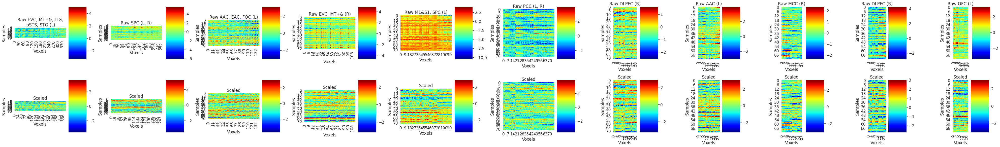

Participant 2


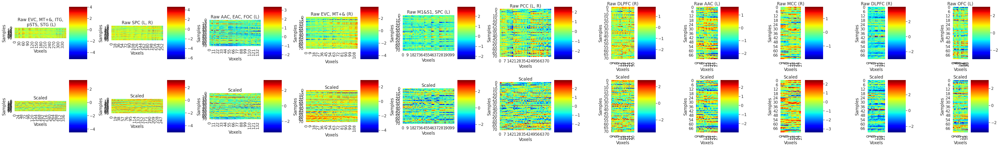

Participant 3


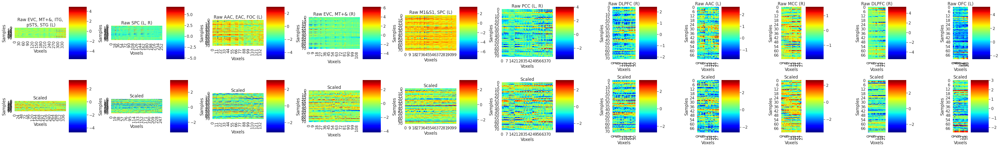

Participant 4


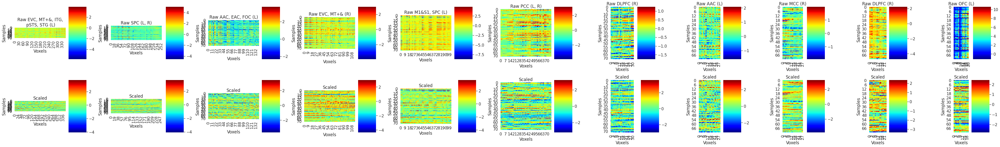

Participant 5


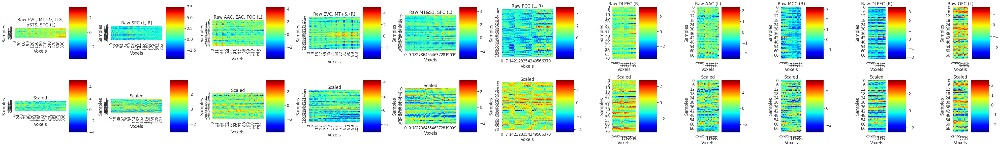

Participant 6


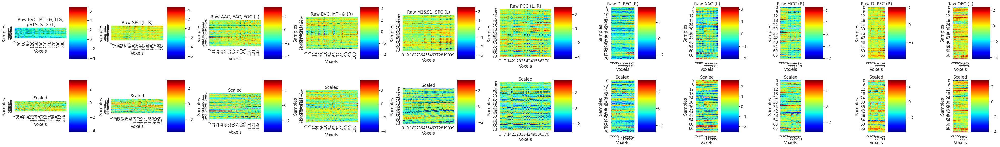

Participant 7


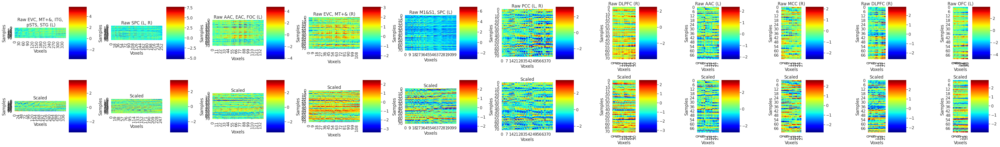

Participant 8


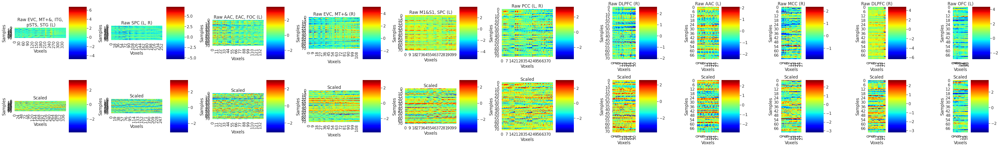

Participant 9


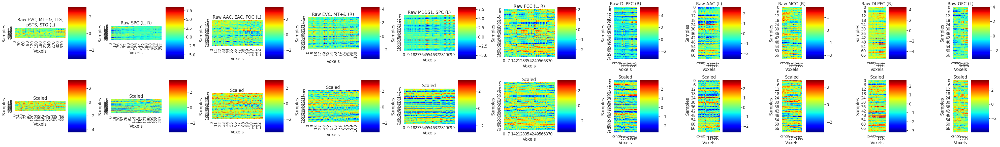

Participant 10


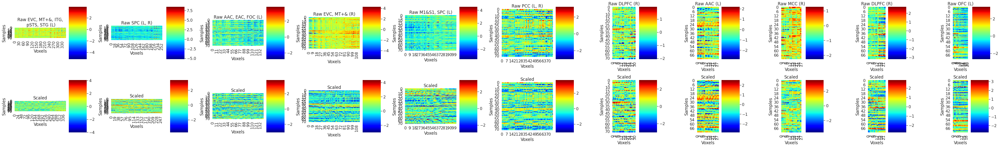

Participant 11


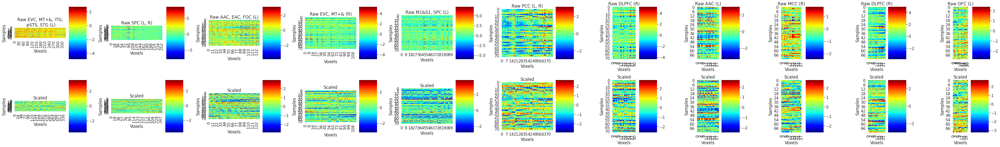

Participant 12


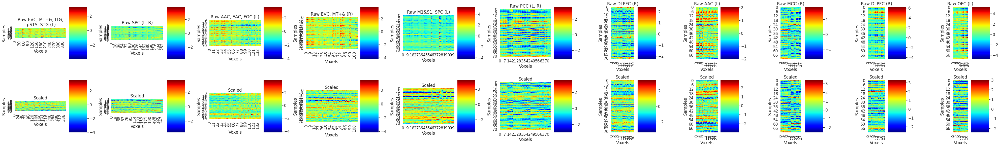

Participant 13


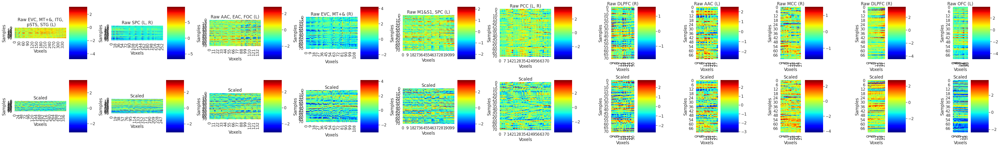

Participant 14


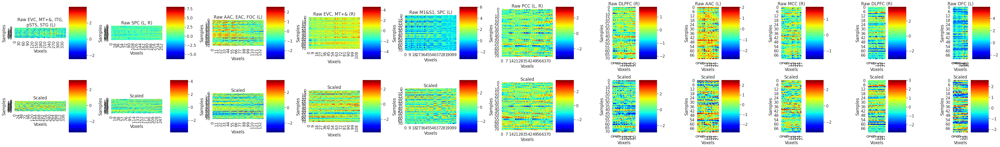

Participant 15


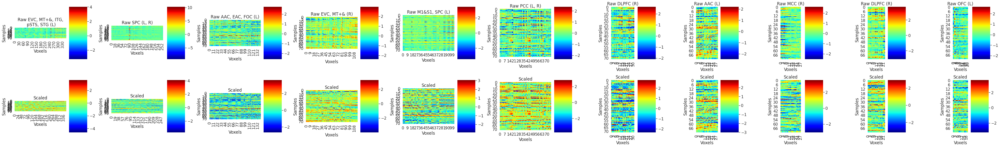

In [41]:
# Animacy
ti = 4
st = int(np.sum(roi_num_list[:ti]))
tot_roin = roi_num_list[ti]
for sbj_idx in range(15):
    print('Participant', sbj_idx+1)
    type_ = interest_list[ti]
    fin = np.sum(roi_num_list[:ti+1])
    roi_masks_tp = roi_masks[st:fin]
    width = 5*tot_roin
    f, axes = plt.subplots(2,tot_roin,figsize=(width,8),constrained_layout=True)
    ax = axes.flat
    for ri in range(tot_roin):
        arr = betasz_grp[:,:,:,:,sbj_idx][np.where(roi_masks_tp[ri]==1)].copy() #nvv,192,15
        arr = get_arr_ind(arr) # nvv, sam_num, 15
        rep_ = arr.transpose() # sam_num, nvv
        nvv = rep_.shape[1]
        std_ = StandardScaler()
        x_scld = std_.fit_transform(rep_) # sam_num, nvv
        sns.heatmap(rep_,cmap='jet',square=True,ax=ax[ri])
        ax[ri].set_title('Raw '+rep_roi[ti][ri])
        ax[ri].set(xlabel='Voxels', ylabel="Samples")
        sns.heatmap(x_scld,cmap='jet',square=True,ax=ax[ri+tot_roin])
        ax[ri+tot_roin].set_title('Scaled')
        ax[ri+tot_roin].set(xlabel='Voxels', ylabel="Samples")
    plt.show()